In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.preprocessing import MinMaxScaler
import random
from sklearn.metrics import mean_absolute_error
from statistics import mean

### Directory List

In [2]:
input_file_dir = "../dataset/nonfin_2020_2023_striped.csv"
model_input_dir = "../models/model_LSTM_CMB_cabang_64/"
prediction_output_dir = "../predictions/CMB_new/"
forecast_output_dir = "../forecast/CMB_new/" # append file name

In [3]:
df = pd.read_csv(input_file_dir, delimiter="|", header=0, dtype=str)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15319761 entries, 0 to 15319760
Data columns (total 12 columns):
 #   Column             Dtype 
---  ------             ----- 
 0   dt                 object
 1   trans_type_key     object
 2   trans_lng_nm       object
 3   branch_key         object
 4   sumtrx             object
 5   branch_address1    object
 6   branch_address2    object
 7   region_key         object
 8   jabo_nonjabotabek  object
 9   city_key           object
 10  geography          object
 11  flag_big_city      object
dtypes: object(12)
memory usage: 1.4+ GB


In [5]:
df.head()

,dt,trans_type_key,trans_lng_nm,branch_key,sumtrx,branch_address1,branch_address2,region_key,jabo_nonjabotabek,city_key,geography,flag_big_city
0,2020-10-20,435,Pemesanan Warkat,838,3,SENTRA NIAGA HARAPAN INDAH KAV. CP2 NO.1 KOTA ...,17214,9,J,24,JAKARTA,B
1,2021-04-19,727,Cetak Mutasi Harian,259,2,JL. MUWARDI 1/44,11450,10,J,24,NaN,B
2,2021-05-03,482,Buka Blokir Kartu,1074,2,"KOMP. PERUM TAMAN PALEM LESTARI C5 NO. 9 -11, ...",11730,12,J,24,NaN,B
3,2021-03-08,383,Registrasi m-BCA,196,22,JL. TRUNOJOYO 145,68137,7,N,20,NaN,K
4,2021-11-09,436,Penawaran Solusi,1336,1,"JL. RADEN SALEH NO. 39B, KEL. KARANG MULYA, KE...",15157,12,J,24,NaN,B


In [6]:
# row_filter = df["trans_lng_nm"] == "Cetak Mutasi Bulanan"
col_filter = ["dt", "trans_type_key", "trans_lng_nm", "branch_key", "sumtrx"]
df = df.loc[:, col_filter]

In [7]:
df.head()

,dt,trans_type_key,trans_lng_nm,branch_key,sumtrx
0,2020-10-20,435,Pemesanan Warkat,838,3
1,2021-04-19,727,Cetak Mutasi Harian,259,2
2,2021-05-03,482,Buka Blokir Kartu,1074,2
3,2021-03-08,383,Registrasi m-BCA,196,22
4,2021-11-09,436,Penawaran Solusi,1336,1


In [8]:
df["dt"]                 = pd.to_datetime(df["dt"])
df["trans_lng_nm"]       = df["trans_lng_nm"].astype(str)
df["branch_key"]         = df["branch_key"].astype(np.int32)
df["sumtrx"]             = df["sumtrx"].astype(np.int32)

In [9]:
df

,dt,trans_type_key,trans_lng_nm,branch_key,sumtrx
0,2020-10-20,435,Pemesanan Warkat,838,3
1,2021-04-19,727,Cetak Mutasi Harian,259,2
2,2021-05-03,482,Buka Blokir Kartu,1074,2
3,2021-03-08,383,Registrasi m-BCA,196,22
4,2021-11-09,436,Penawaran Solusi,1336,1
...,...,...,...,...,...
15319756,2022-03-16,457,Turek Tabungan Berjangka SBJT,164,1
15319757,2022-05-27,457,Turek Tabungan Berjangka SBJT,1017,1
15319758,2022-04-28,457,Turek Tabungan Berjangka SBJT,1087,1
15319759,2022-08-30,457,Turek Tabungan Berjangka SBJT,217,1


In [10]:
# df = df.sort_values(by=["dt"], ascending=True).set_index("dt")

In [11]:
df

,dt,trans_type_key,trans_lng_nm,branch_key,sumtrx
0,2020-10-20,435,Pemesanan Warkat,838,3
1,2021-04-19,727,Cetak Mutasi Harian,259,2
2,2021-05-03,482,Buka Blokir Kartu,1074,2
3,2021-03-08,383,Registrasi m-BCA,196,22
4,2021-11-09,436,Penawaran Solusi,1336,1
...,...,...,...,...,...
15319756,2022-03-16,457,Turek Tabungan Berjangka SBJT,164,1
15319757,2022-05-27,457,Turek Tabungan Berjangka SBJT,1017,1
15319758,2022-04-28,457,Turek Tabungan Berjangka SBJT,1087,1
15319759,2022-08-30,457,Turek Tabungan Berjangka SBJT,217,1


In [12]:
top_branches_key = [137, 145, 64, 164, 17, 237, 274, 404, 37, 45]

In [13]:
# row_filter = (df["branch_key"] == 137) & (df["dt"] >= "2020-01-02") & (df["dt"] <= "2023-06-16")
# col_filter = ["dt", "sumtrx"]
# df.loc[row_filter, col_filter].groupby("dt") \
#                .agg({"sumtrx": "sum"}) \
#                .sort_values(by=["dt"], ascending=True) \
#                .asfreq('D', fill_value=0)

In [14]:
# Membuat fungsi untuk mengubah data menjadi bentuk yang sesuai untuk LSTM
def create_dataset(data, time_steps):
    X, Y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:(i + time_steps), 0])
        Y.append(data[i + time_steps, 0])
    return np.array(X), np.array(Y)

In [15]:
def calc_mae(actual, predicted):
    mae = mean_absolute_error(actual, predicted)
    return mae

In [16]:
def calc_smape(actual, predicted):
    numerator = np.abs(actual - predicted)
    denominator = (np.abs(actual) + np.abs(predicted)) / 2
    smape_score = np.mean(numerator / denominator) * 100
    return smape_score

In [17]:
def set_data(df, transaction_name, branch_key): 
    filter_column = (df['trans_lng_nm'] == transaction_name) & (df['branch_key'] == branch_key)
    res = df[filter_column]
    res = res.groupby(['trans_lng_nm', 'dt']).agg({'sumtrx':'sum'})
    res.reset_index(level=0, drop=True, inplace=True)
    
    return res

In [18]:
def set_testset(df, date_start, date_end):
    res = df.loc[date_start:date_end]
    return res

In [19]:
def fill_datetime(df, date_start, date_end):
    # Membuat rentang tanggal yang diinginkan
    date_range = pd.date_range(start=date_start, end=date_end, freq='D')

    # Mengisi dataframe dengan rentang tanggal yang lengkap
    res = df.reindex(date_range, fill_value=0)

    # Return dataframe yang telah diisi dengan nilai nol pada tanggal yang hilang
    return res

In [20]:
date_start = "2020-01-02"
date_end   = "2023-06-18"
actual = set_data(df, "Cetak Mutasi Bulanan", 64)
actual = set_testset(actual, date_start, date_end)
actual = fill_datetime(actual, date_start, date_end)
actual

,sumtrx
2020-01-02,32
2020-01-03,69
2020-01-04,0
2020-01-05,0
2020-01-06,165
...,...
2023-06-14,22
2023-06-15,47
2023-06-16,15
2023-06-17,0


40/40 [==============================] - 1s 6ms/step
            Actual  Predicted
2020-01-09      37  60.780190
2020-01-10      68  34.631367
2020-01-11       0   0.383066
2020-01-12       0  -0.387857
2020-01-13      62   7.677320
...            ...        ...
2023-06-14      20  44.173573
2023-06-15      23  25.068953
2023-06-16      22  25.284344
2023-06-17       0  -0.144957
2023-06-18       0  -0.305983

[1257 rows x 2 columns]


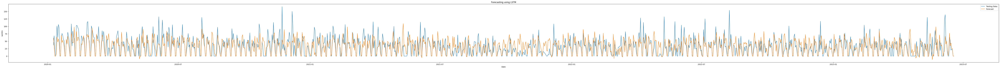

40/40 [==============================] - 1s 5ms/step
            Actual  Predicted
2020-01-09      36  28.752953
2020-01-10      26  18.697304
2020-01-11       0  -1.349296
2020-01-12       0   4.162372
2020-01-13      29  33.040554
...            ...        ...
2023-06-14      16  24.537113
2023-06-15      21  54.381565
2023-06-16      55  47.708961
2023-06-17       0   0.608077
2023-06-18       0   1.663658

[1257 rows x 2 columns]


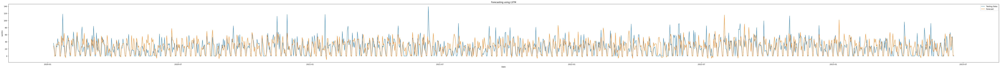

40/40 [==============================] - 1s 5ms/step
            Actual   Predicted
2020-01-09     115  114.759964
2020-01-10     154  152.196152
2020-01-11       0   -0.369748
2020-01-12       0    0.774480
2020-01-13     139  139.024338
...            ...         ...
2023-06-14      22   22.947174
2023-06-15      47   47.145008
2023-06-16      15   16.098913
2023-06-17       0   -0.177064
2023-06-18       0    2.671064

[1257 rows x 2 columns]


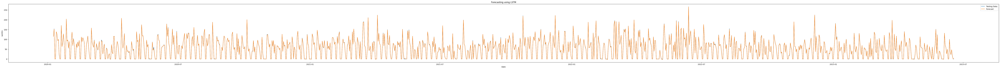

40/40 [==============================] - 1s 5ms/step
            Actual  Predicted
2020-01-09      56  87.240204
2020-01-10      55  66.912964
2020-01-11       0  -0.917947
2020-01-12       0  -0.388816
2020-01-13     107  94.117493
...            ...        ...
2023-06-14      20  49.921299
2023-06-15      25  38.453236
2023-06-16      13  45.562233
2023-06-17       0   1.514128
2023-06-18       0  17.394138

[1257 rows x 2 columns]


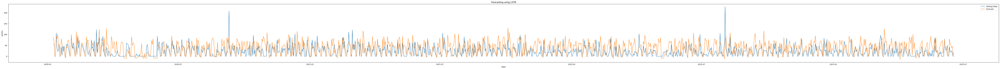

40/40 [==============================] - 1s 5ms/step
            Actual   Predicted
2020-01-09      89   33.267815
2020-01-10      71   60.270107
2020-01-11      13    0.108942
2020-01-12       0    0.078875
2020-01-13     126  123.628700
...            ...         ...
2023-06-14      94   46.451214
2023-06-15      23   79.055069
2023-06-16      31   35.215965
2023-06-17       0    8.343368
2023-06-18       0   11.447229

[1257 rows x 2 columns]


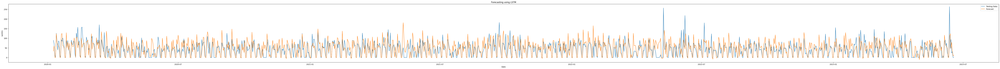

40/40 [==============================] - 1s 5ms/step
            Actual  Predicted
2020-01-09      86  26.157028
2020-01-10      53  45.319462
2020-01-11       0  -0.082154
2020-01-12       0  -0.163490
2020-01-13      68  58.714909
...            ...        ...
2023-06-14      19  44.408962
2023-06-15      35  45.846218
2023-06-16      14  32.695946
2023-06-17       0   1.292089
2023-06-18       0  20.272875

[1257 rows x 2 columns]


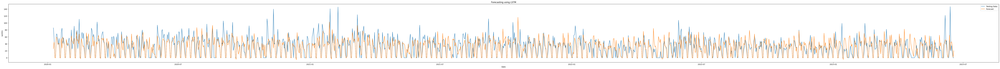

40/40 [==============================] - 1s 5ms/step
            Actual  Predicted
2020-01-09      53  51.054466
2020-01-10      50  30.593975
2020-01-11       0  -0.636799
2020-01-12       0   0.180189
2020-01-13      51  35.089050
...            ...        ...
2023-06-14      29  41.558216
2023-06-15       9  24.918592
2023-06-16      27  26.778866
2023-06-17       0  -0.055884
2023-06-18       0   0.287970

[1257 rows x 2 columns]


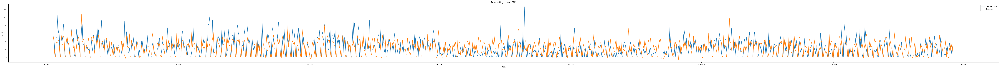

40/40 [==============================] - 1s 5ms/step
            Actual   Predicted
2020-01-09      47  105.648636
2020-01-10      32   31.204481
2020-01-11       0    0.465806
2020-01-12       0   12.182652
2020-01-13      30   98.897133
...            ...         ...
2023-06-14      14  112.525330
2023-06-15      81   72.738503
2023-06-16      49   60.135967
2023-06-17       0   28.638035
2023-06-18       0   14.825582

[1257 rows x 2 columns]


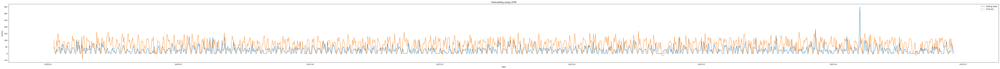

40/40 [==============================] - 1s 5ms/step
            Actual  Predicted
2020-01-09      18  96.389175
2020-01-10      58  65.158524
2020-01-11       0   1.514633
2020-01-12       0  -9.544485
2020-01-13      42  88.104752
...            ...        ...
2023-06-14      70  70.074409
2023-06-15      56  68.414230
2023-06-16      56  69.639076
2023-06-17       0   2.708671
2023-06-18       0   1.320422

[1257 rows x 2 columns]


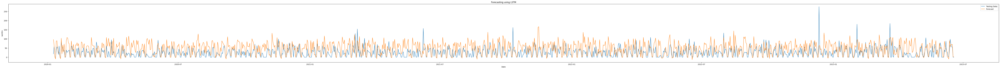

40/40 [==============================] - 1s 5ms/step
            Actual  Predicted
2020-01-09      16  34.557072
2020-01-10      44  90.593376
2020-01-11       0   8.931674
2020-01-12       0  13.919629
2020-01-13      53  51.677757
...            ...        ...
2023-06-14      27  54.460239
2023-06-15      42  58.418587
2023-06-16      41  48.861652
2023-06-17       0   0.255513
2023-06-18       0  -0.500940

[1257 rows x 2 columns]


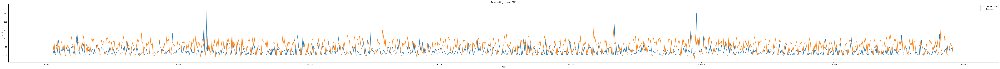

In [24]:
MAE_for_branch = {}
SMAPE_for_branch = {}
for branch_key in top_branches_key:
    date_start = "2020-01-02"
    date_end   = "2023-06-18"
    actual = set_data(df, "Cetak Mutasi Bulanan", branch_key)
    actual = set_testset(actual, date_start, date_end)
    actual = fill_datetime(actual, date_start, date_end)
    time_steps = 7

    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_res = scaler.fit_transform(actual.values.reshape(-1, 1))
    
    x__test, y__test = create_dataset(scaled_res, time_steps)
    x__test = np.reshape(x__test, (x__test.shape[0], x__test.shape[1], 1))
    model = tf.keras.models.load_model(model_input_dir)

    predicted = model.predict(x__test)
    predicted = scaler.inverse_transform(predicted)

    # Menampilkan hasil prediksi
    predicted_data = pd.DataFrame(predicted, columns=['Predicted'], index=actual[time_steps:].index)
    actual_data = pd.DataFrame(actual[time_steps:].values, columns=['Actual'], index=actual[time_steps:].index)
    actual_vs_predicted = pd.concat([actual_data, predicted_data], axis=1)
    print(actual_vs_predicted)

    MAE_for_branch[branch_key] = calc_mae(actual_vs_predicted["Actual"], actual_vs_predicted["Predicted"])
    SMAPE_for_branch[branch_key] = calc_smape(actual_vs_predicted["Actual"], actual_vs_predicted["Predicted"])

    plt.figure(figsize=(100, 6))
    plt.plot(actual_vs_predicted.index, actual_vs_predicted["Actual"], label='Testing Data')
    plt.plot(actual_vs_predicted.index, actual_vs_predicted["Predicted"], label='Forecast')
    plt.xlabel('Date')
    plt.ylabel('sumtrx')
    plt.title('Forecasting using LSTM')
    plt.legend()
    plt.show()

    # Save the data as a CSV file 
    ###################### Ganti csv_{i} ke contoh xpresi{i}/ gantikartu_{i} #######################
    # csv_filename = f"Cetak_Mutasi_Bulanan_{branch_key}.csv"
    # actual_vs_predicted.to_csv(f"{prediction_output_dir}{csv_filename}", index=True)
    # print(f"CSV file {csv_filename} saved.")
    
    
    

In [25]:
print(model_input_dir, "\n")
for branch_key in top_branches_key:
    print(f"Branch {branch_key}")
    print(f"MAE = {MAE_for_branch[branch_key]}")
    print(f"SMAPE = {SMAPE_for_branch[branch_key]}\n")

../models/model_LSTM_CMB_cabang_64/ 

Branch 137
MAE = 17.52269235563923
SMAPE = 100.94410909644455

Branch 145
MAE = 14.273136995145984
SMAPE = 104.238331450679

Branch 64
MAE = 0.684446435732887
SMAPE = 67.76655463223219

Branch 164
MAE = 24.925866790868596
SMAPE = 119.44335948998554

Branch 17
MAE = 24.32080252481626
SMAPE = 97.99760607550728

Branch 237
MAE = 14.555097440914114
SMAPE = 96.12514935828342

Branch 274
MAE = 13.644566335927994
SMAPE = 106.61576166020512

Branch 404
MAE = 43.43633454051773
SMAPE = 124.75977956359836

Branch 37
MAE = 30.294838633865425
SMAPE = 114.50907310098512

Branch 45
MAE = 35.51816676227508
SMAPE = 123.63132127802045



            sumtrx
2020-01-02      81
2020-01-03      71
2020-01-04       0
2020-01-05       0
2020-01-06      77
...            ...
2023-06-14      20
2023-06-15      23
2023-06-16      22
2023-06-17       0
2023-06-18       0

[1264 rows x 1 columns]
1/1 [==============================] - 0s 26ms/step


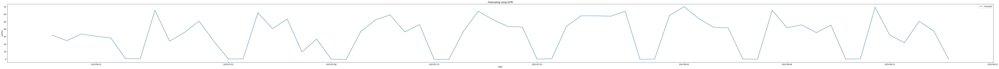

CSV file Cetak_Mutasi_Bulanan_137.csv saved.
            sumtrx
2020-01-02      59
2020-01-03      36
2020-01-04       0
2020-01-05       0
2020-01-06      38
...            ...
2023-06-14      16
2023-06-15      21
2023-06-16      55
2023-06-17       0
2023-06-18       0

[1264 rows x 1 columns]
1/1 [==============================] - 0s 28ms/step


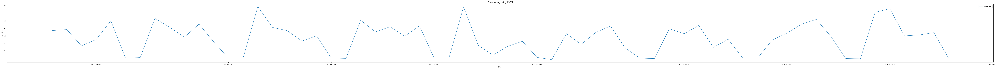

CSV file Cetak_Mutasi_Bulanan_145.csv saved.
            sumtrx
2020-01-02      32
2020-01-03      69
2020-01-04       0
2020-01-05       0
2020-01-06     165
...            ...
2023-06-14      22
2023-06-15      47
2023-06-16      15
2023-06-17       0
2023-06-18       0

[1264 rows x 1 columns]
1/1 [==============================] - 0s 32ms/step


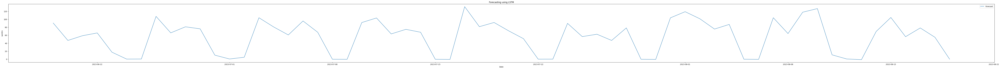

CSV file Cetak_Mutasi_Bulanan_64.csv saved.
            sumtrx
2020-01-02      48
2020-01-03      58
2020-01-04       0
2020-01-05       0
2020-01-06      29
...            ...
2023-06-14      20
2023-06-15      25
2023-06-16      13
2023-06-17       0
2023-06-18       0

[1264 rows x 1 columns]
1/1 [==============================] - 0s 22ms/step


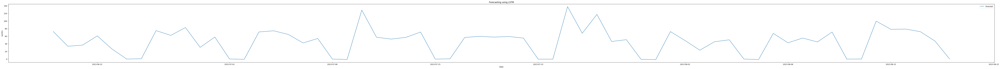

CSV file Cetak_Mutasi_Bulanan_164.csv saved.
            sumtrx
2020-01-02      82
2020-01-03      55
2020-01-04       4
2020-01-05       0
2020-01-06      79
...            ...
2023-06-14      94
2023-06-15      23
2023-06-16      31
2023-06-17       0
2023-06-18       0

[1264 rows x 1 columns]
1/1 [==============================] - 0s 29ms/step


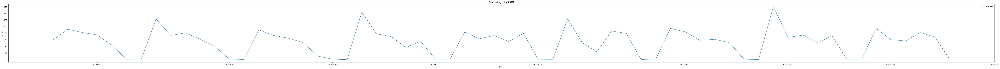

CSV file Cetak_Mutasi_Bulanan_17.csv saved.
            sumtrx
2020-01-02      55
2020-01-03      48
2020-01-04       0
2020-01-05       0
2020-01-06      66
...            ...
2023-06-14      19
2023-06-15      35
2023-06-16      14
2023-06-17       0
2023-06-18       0

[1264 rows x 1 columns]
1/1 [==============================] - 0s 26ms/step


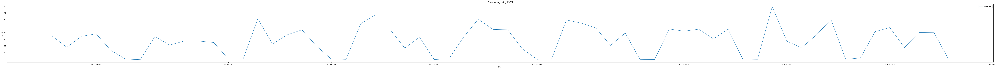

CSV file Cetak_Mutasi_Bulanan_237.csv saved.
            sumtrx
2020-01-02      30
2020-01-03      49
2020-01-04       0
2020-01-05       0
2020-01-06      35
...            ...
2023-06-14      29
2023-06-15       9
2023-06-16      27
2023-06-17       0
2023-06-18       0

[1264 rows x 1 columns]
1/1 [==============================] - 0s 28ms/step


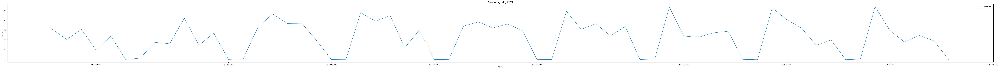

CSV file Cetak_Mutasi_Bulanan_274.csv saved.
            sumtrx
2020-01-02      44
2020-01-03      10
2020-01-04       0
2020-01-05       0
2020-01-06      54
...            ...
2023-06-14      14
2023-06-15      81
2023-06-16      49
2023-06-17       0
2023-06-18       0

[1264 rows x 1 columns]
1/1 [==============================] - 0s 25ms/step


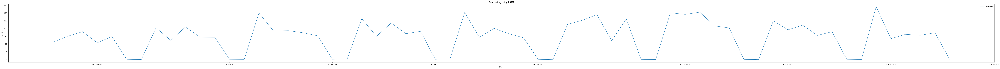

CSV file Cetak_Mutasi_Bulanan_404.csv saved.
            sumtrx
2020-01-02      18
2020-01-03      26
2020-01-04       0
2020-01-05       0
2020-01-06      48
...            ...
2023-06-14      70
2023-06-15      56
2023-06-16      56
2023-06-17       0
2023-06-18       0

[1264 rows x 1 columns]
1/1 [==============================] - 0s 30ms/step


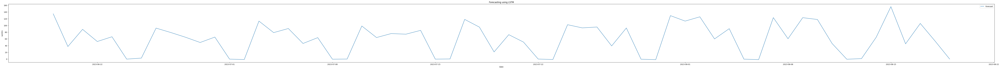

CSV file Cetak_Mutasi_Bulanan_37.csv saved.
            sumtrx
2020-01-02      18
2020-01-03      87
2020-01-04       0
2020-01-05       0
2020-01-06      32
...            ...
2023-06-14      27
2023-06-15      42
2023-06-16      41
2023-06-17       0
2023-06-18       0

[1264 rows x 1 columns]
1/1 [==============================] - 0s 27ms/step


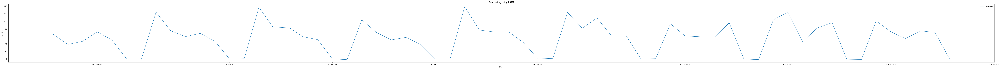

CSV file Cetak_Mutasi_Bulanan_45.csv saved.


In [23]:
MAE_for_branch = {}
SMAPE_for_branch = {}
for branch_key in top_branches_key:
    date_start = "2020-01-02"
    date_end   = "2023-06-18"
    actual = set_data(df, "Cetak Mutasi Bulanan", branch_key)
    actual = set_testset(actual, date_start, date_end)
    actual = fill_datetime(actual, date_start, date_end)
    print(actual)

    #test
    # row_filter = df["branch_key"] == branch_key
    # col_filter = ["dt", "sumtrx"]
    # test = df.loc[row_filter, col_filter] \
    #            .groupby("dt") \
    #            .agg({"sumtrx": "sum"}) \
    #            .sort_values(by=["dt"], ascending=True) \
    #            .asfreq('D', fill_value=0)
    # print(test)
    # break
    time_steps = 7

    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_res = scaler.fit_transform(actual.values)

    # DATA EXTEND PREDICT PREPARATION
    date_start_predict = "2023-06-19"
    date_end_predict = "2023-08-19"

    # Buat rentang tanggal yang diinginkan
    date_range = pd.date_range(start=date_start_predict, end=date_end_predict, freq='D')

    # Buat array kosong untuk menampung input prediksi
    x__test = np.zeros((len(date_range) + time_steps, 1))

    # Isi array x__test dengan nilai awal yang sesuai
    initial_data = scaled_res[-time_steps:, 0]
    x__test[:time_steps, 0] = initial_data
    
    model = tf.keras.models.load_model(model_input_dir)

    # Melakukan prediksi
    for step in range(len(date_range)):
        input_data = np.reshape(x__test[step:step+time_steps, 0], (1, time_steps, 1))
        forecast = model.predict(input_data)
        x__test[step+time_steps, 0] = forecast

    forecast = scaler.inverse_transform(x__test[time_steps:, 0].reshape(-1, 1))
    
    forecast_result = pd.DataFrame(index=date_range).rename_axis("dt")
    forecast_result["Predicted"] = forecast

    plt.figure(figsize=(100, 6))
    plt.plot(forecast_result.index, forecast_result["Predicted"], label="Forecast")
    plt.xlabel('Date')
    plt.ylabel('sumtrx')
    plt.title('Forecasting using LSTM')
    plt.legend()
    plt.show()

    # Save the data as a CSV file 
    ###################### Ganti csv_{i} ke contoh xpresi{i}/ gantikartu_{i} #######################
    csv_filename = f"Cetak_Mutasi_Bulanan_{branch_key}.csv"
    forecast_result.to_csv(f"{forecast_output_dir}{csv_filename}", index=True)
    print(f"CSV file {csv_filename} saved.")
    
    
    